In [1]:
import numpy as np
import librosa
import librosa.display
import matplotlib.pyplot as plt
%matplotlib inline
import mir_eval
from IPython.display import Audio, display
np.set_printoptions(precision=3, linewidth=52)
import pandas as pd
pd.options.display.precision = 3
import mir_eval.display

# mir_eval

```
$ pip install mir_eval
```

```python
>>> import mir_eval
```

# Evaluating MIR systems
    
- Most tasks in MIR are **complicated**

- Any given task has many ways to evaluate a system

- Evaluations can also be complicated!

# Why mir_eval?

- Complex evaluations are difficult to implement

- Different implementations may differ subtly

   - Event matching
   - Time-padding
   - Tolerance windows
   - Vocabulary alignment
   - ...

# Tasks / submodules in mir_eval

- `onset`, `tempo`, `beat`
- `chord`, `key`
- `melody`, `multipitch`
- `transcription`
- `segment`, `hierarchy`, `pattern`
- `separation`

# Example 1: onset detection


In [2]:
# Load in an audio signal
y, sr = librosa.load('jg_flute-alto-lick.flac')

# Estimate the onset times
est_onsets = librosa.onset.onset_detect(y=y, sr=sr, units='time')

# Load in the reference annotation
ref_onsets = np.loadtxt('jg_flute-alto-lick.onsets')
print(ref_onsets[:5], '\n', est_onsets[:5])

[0.027 0.212 0.38  0.515 0.703] 
 [0.07  0.209 0.348 0.418 0.534]


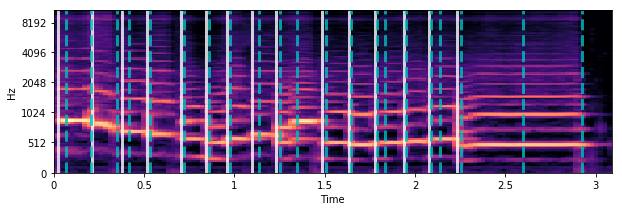

In [3]:
plt.figure(figsize=(10, 3))
M = librosa.power_to_db(librosa.feature.melspectrogram(y=y, sr=sr), ref=np.max)
librosa.display.specshow(M, x_axis='time', y_axis='mel')
mir_eval.display.events(ref_onsets, color='w', alpha=0.8, linewidth=3)
mir_eval.display.events(est_onsets, color='c', alpha=0.8, linewidth=3, linestyle='--');

# How accurate were we?

In [4]:
mir_eval.onset.evaluate(ref_onsets, est_onsets)

OrderedDict([('F-measure', 0.8333333333333333),
             ('Precision', 0.7142857142857143),
             ('Recall', 1.0)])

### Onset evaluation

- Let $E = \{ \text{estimated event times}\}$


- Let $R = \{ \text{reference event times}\}$


- Define *matching* $M = \left\{(e, r) ~\middle|~ |e-r|<\delta\right\} \subseteq E \times R$ 

    - where no $e$ or $r$ occurs more than once.


- For onset detection, $\delta=$ 50ms


- Precision = $|M|~/~|E|$


- Recall = $|M|~/~|R|$

### Optimal matchings

- If there are multiple $r$ within $\delta$ of $e$, which do you pick?



- `mir_eval` finds the largest feasible set $M$ using the [Hopcroft-Karp algorithm](https://en.wikipedia.org/wiki/Hopcroft%E2%80%93Karp_algorithm)



- **This matters!** getting it wrong can introduce ~1% *relative* error in evaluation



- `beat`, `segment`, and `transcription` all rely on matchings

### Example 2: beat tracking

In [5]:
# load the reference annotation
ref_beats = np.loadtxt('SMC_289.txt')
print('Reference beats:  {}, ...'.format(ref_beats[:6]))

y, sr = librosa.load('SMC_289.wav')

# estimate beat timings
est_tempo, est_beats = librosa.beat.beat_track(y=y, sr=sr, units='time')
print('Estimated beats:  {}, ...'.format(est_beats[:6]))

Reference beats:  [0.464 1.086 1.649 2.269 2.833 3.463], ...
Estimated beats:  [0.511 1.068 1.672 2.299 2.902 3.483], ...


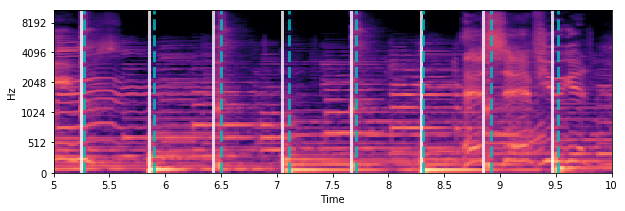

In [6]:
plt.figure(figsize=(10, 3))
S = librosa.feature.melspectrogram(y=y, sr=sr)
librosa.display.specshow(librosa.power_to_db(S, ref=np.max), x_axis='time', y_axis='mel', rasterized=True)
mir_eval.display.events(ref_beats, color='w', alpha=0.8, linewidth=3)
mir_eval.display.events(est_beats, color='c', alpha=0.8, linewidth=3, linestyle='--')
plt.xlim([5, 10]);
display(Audio(data=y, rate=sr))

# How accurate were we?

In [7]:
results = mir_eval.beat.evaluate(ref_beats, est_beats)
pd.Series(data=results)

F-measure                          0.903
Cemgil                             0.680
Cemgil Best Metric Level           0.680
Goto                               0.000
P-score                            0.948
Correct Metric Level Continuous    0.948
Correct Metric Level Total         0.948
Any Metric Level Continuous        0.948
Any Metric Level Total             0.948
Information gain                   0.383
dtype: float64

# What just happened?

- Each task has one or more *metrics*
- Within a task, all metrics share a common data format
    - eg, beat time (in seconds)
- Each task has a top-level `evaluate` function
    - `evaluate(reference, estimate)` computes all metrics

## Example 2: chord estimation

In [8]:
display(Audio(filename='TRAJQHL149E3EF231A.mp3'))

# load in the reference annotation
ref_ints, ref_chords = \
    mir_eval.io.load_labeled_intervals('TRAJQHL149E3EF231A_ref__chord__00.csv',
                                       delimiter=',')

# And the estimated annotation
est_ints, est_chords = \
    mir_eval.io.load_labeled_intervals('TRAJQHL149E3EF231A_est__chord__00.csv',
                                       delimiter=',')

# print out the first few labeled estimate intervals
for interval, label in zip(est_ints[:5], est_chords):
    print(interval, label)

[0.    0.093] D:maj
[0.093 3.622] G:maj
[3.622 6.966] E:min
[ 6.966 10.403] G:maj
[10.403 13.096] D:maj


In [18]:
res = mir_eval.chord.evaluate(ref_ints, ref_chords,
                              est_ints, est_chords)
pd.Series(res)

thirds          0.841
thirds_inv      0.841
triads          0.804
triads_inv      0.804
tetrads         0.804
tetrads_inv     0.804
root            0.854
mirex           0.850
majmin          0.850
majmin_inv      0.850
sevenths        0.850
sevenths_inv    0.850
underseg        0.856
overseg         0.798
seg             0.798
dtype: float64

# More than metrics

**Display** and **Sonification** can help understand what your system is doing!

`mir_eval` has tools for this!

## Display module

- `import mir_eval.display`

- `matplotlib` plots for standard MIR tasks

- Common plots:
    - `events` (optional labels)
    - `labeled_intervals`
    
---
- `pitch`, `multipitch`, `piano_roll`
- `segments`, `hierarchy`
- `separation`

## Display example (events)

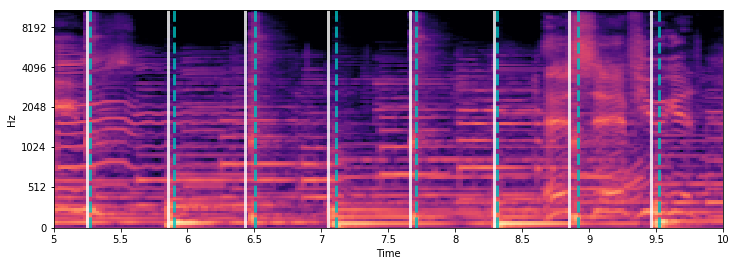

In [23]:
plt.figure(figsize=(12, 4))
librosa.display.specshow(librosa.power_to_db(S, ref=np.max),
                         x_axis='time', y_axis='mel', rasterized=True)

mir_eval.display.events(ref_beats, color='w', alpha=0.8, linewidth=3)
mir_eval.display.events(est_beats, color='c', alpha=0.8, linewidth=3,
                        linestyle='--')
plt.xlim([5, 10]);

## Display example (labeled intervals)

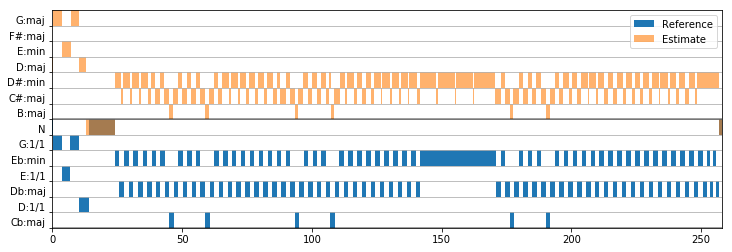

In [24]:
plt.figure(figsize=(12, 4))
mir_eval.display.labeled_intervals(ref_ints, ref_chords,
                                   label='Reference')
mir_eval.display.labeled_intervals(est_ints, est_chords,
                                   label='Estimate', alpha=0.6)
plt.legend();

### Display example (source separation)

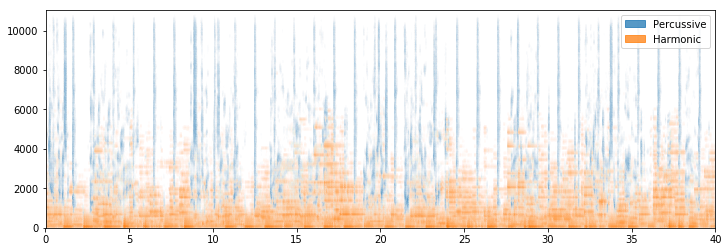

In [25]:
y_harm, y_perc = librosa.effects.hpss(y, margin=4)

plt.figure(figsize=(12, 4))
mir_eval.display.separation([y_perc, y_harm], sr,
                            labels=['Percussive', 'Harmonic']);
plt.legend(frameon=True);

## Sonification

- `mir_eval.sonify` turns annotations into audio

    - `clicks`
    - `pitch_contour`
    - `chords`
    - `chroma`
    - `time_frequency` (very general)

## Example

In [28]:
# Beats use event sonification
y_son = mir_eval.sonify.clicks(est_beats, sr, length=len(y))
Audio(data=np.vstack([y, y_son]), rate=sr)

In [ ]:
y2, sr = librosa.load('TRAJQHL149E3EF231A.mp3')
y_chord = mir_eval.sonify.chords(est_chords, est_ints, sr, length=len(y2))
Audio(data=np.vstack([y2, y_chord]), rate=sr)

# Wrap up

- Don't write your own eval code 

    - *unless you really have to!*

- Quantitative evaluation is the **beginning, not the end!**

- Always look at your data and estimates